Load the labeled Data

In [ ]:
# download, decompress the data
!wget https://paingthet.com/TrainTesting.zip
!unzip TrainTesting.zip > /dev/null

--2022-06-25 19:11:19--  https://paingthet.com/TrainTesting.zip
Resolving paingthet.com (paingthet.com)... 43.255.154.8
Connecting to paingthet.com (paingthet.com)|43.255.154.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 301547749 (288M) [application/zip]
Saving to: ‘TrainTesting.zip.1’

TrainTesting.zip.1  100%[===================>] 287.58M  19.0MB/s    in 19s     

2022-06-25 19:11:38 (15.0 MB/s) - ‘TrainTesting.zip.1’ saved [301547749/301547749]

replace __MACOSX/._TrainTesting? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace TrainTesting/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace __MACOSX/TrainTesting/._.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


# Install Dependencies

In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
#install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# After this step it will ask you to restart the runtime, please do it.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html


In [ ]:
import torch
assert torch.__version__.startswith("1.8") 
import torchvision
import cv2

In [ ]:
import os
import numpy as np
import json
import random
import matplotlib.pyplot as plt
%matplotlib inline

from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

In [ ]:
def get_data_dicts(directory, classes):
    dataset_dicts = []
    for filename in [file for file in os.listdir(directory) if file.endswith('.json')]:
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)

        record = {}
        
        filename = os.path.join(directory, img_anns["imagePath"])
        
        record["file_name"] = filename
        record["height"] = img_anns["imageHeight"]
        record["width"] = img_anns["imageWidth"]
      
        annos = img_anns["shapes"]
        objs = []
        for anno in annos:
            px = [a[0] for a in anno['points']] # x coord
            py = [a[1] for a in anno['points']] # y-coord
            poly = [(x, y) for x, y in zip(px, py)] # poly for segmentation
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": classes.index(anno['label']),
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
classes = ['brick','cementitious_debris','PVC','rebar','wires'] # Change this according to your classes

data_path = "TrainTesting/"

for d in ["train", "test"]:
    DatasetCatalog.register(
        "category_" + d, 
        lambda d=d: get_data_dicts(data_path+d, classes)
    )
    MetadataCatalog.get("category_" + d).set(thing_classes=classes)

microcontroller_metadata = MetadataCatalog.get("category_train")

# Training

[IMPORTANT] For training, make sure you use GPU by going to Runtime->Change Runtime Type and chaning the Hardware Accelerator to GPU

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer

In [ ]:
configuration_file = "mask_rcnn_R_101_C4_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/"+configuration_file))
cfg.DATASETS.TRAIN = ("category_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/"+configuration_file)
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes) # Change this according to your classes

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

[06/25 19:13:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_a2914c.pkl: 220MB [00:02, 91.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (6, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (6,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (20, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (20,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

In [ ]:
trainer.train()

[06/25 19:16:04 d2.engine.train_loop]: Starting training from iteration 0
[06/25 19:16:37 d2.utils.events]:  eta: 1:23:14  iter: 19  total_loss: 3.308  loss_cls: 1.967  loss_box_reg: 0.1351  loss_mask: 0.6956  loss_rpn_cls: 0.3162  loss_rpn_loc: 0.1575  time: 1.6550  data_time: 0.0316  lr: 4.9953e-06  max_mem: 5897M
[06/25 19:17:13 d2.utils.events]:  eta: 1:24:39  iter: 39  total_loss: 3.052  loss_cls: 1.694  loss_box_reg: 0.148  loss_mask: 0.6927  loss_rpn_cls: 0.3411  loss_rpn_loc: 0.1577  time: 1.7186  data_time: 0.0127  lr: 9.9902e-06  max_mem: 6031M
[06/25 19:17:49 d2.utils.events]:  eta: 1:24:43  iter: 59  total_loss: 2.466  loss_cls: 1.323  loss_box_reg: 0.1342  loss_mask: 0.6906  loss_rpn_cls: 0.1788  loss_rpn_loc: 0.1408  time: 1.7417  data_time: 0.0111  lr: 1.4985e-05  max_mem: 6031M
[06/25 19:18:26 d2.utils.events]:  eta: 1:25:30  iter: 79  total_loss: 2.143  loss_cls: 0.8921  loss_box_reg: 0.1463  loss_mask: 0.6848  loss_rpn_cls: 0.2027  loss_rpn_loc: 0.1703  time: 1.7691  

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

#Inference using the Trained Model

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("crack_test", )
predictor = DefaultPredictor(cfg)

In [ ]:
test_dataset_dicts = get_data_dicts(data_path+'val', classes)

TrainTesting/val/brick_8265796.jpg


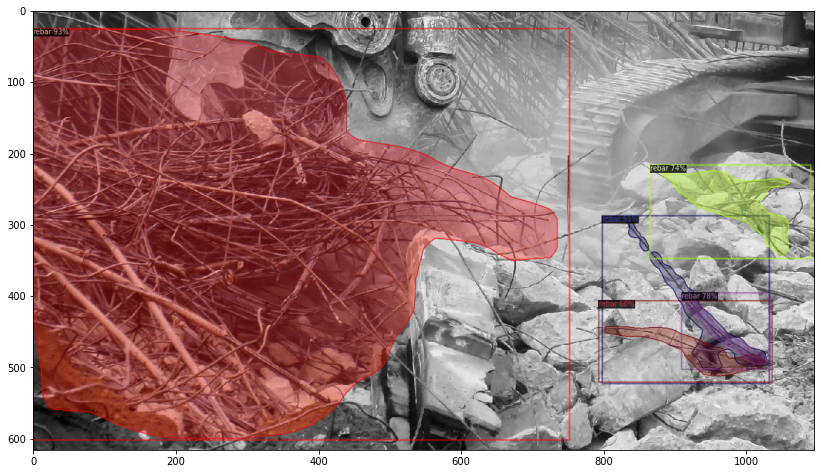

TrainTesting/val/brick_7575830.jpeg


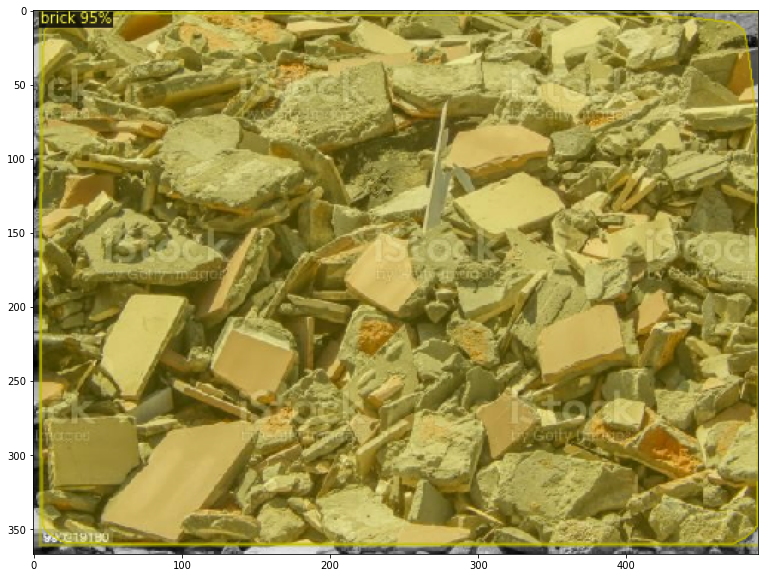

TrainTesting/val/wires_9910131.jpeg


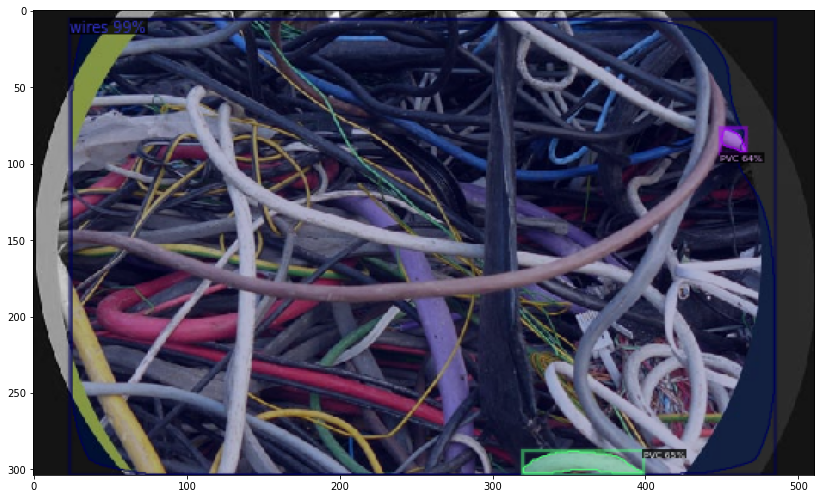

In [ ]:
for d in random.sample(test_dataset_dicts, 3):    
    img = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1],
                   metadata=microcontroller_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW # removes the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

#Testing on image from internet


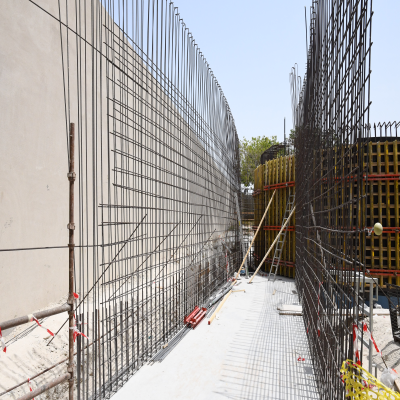

In [ ]:
!wget https://raw.githubusercontent.com/Pi-31415/SMART-SWIPE-DATA-1/main/396136_comp.png -q -O input.jpg
from google.colab.patches import cv2_imshow
img = cv2.imread("./input.jpg")
cv2_imshow(img)

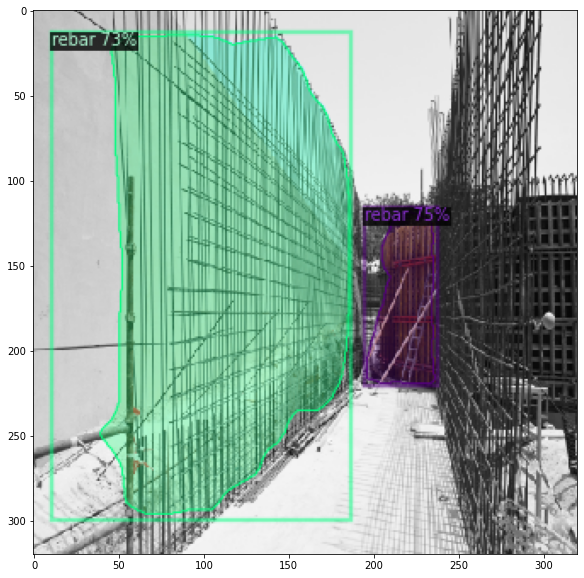

In [ ]:
outputs = predictor(img)
v = Visualizer(img[:, :, ::-1],
                   metadata=microcontroller_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW # removes the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()